In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pandas_profiling import ProfileReport
%matplotlib inline

In [2]:
bike_df = pd.read_csv("day.csv")

## 1. Data exploration and understanding

In [3]:
bike_df.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [4]:
vehicles_report = ProfileReport(bike_df)
print(repr(vehicles_report.report))
print(vehicles_report)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Root



In [5]:
vehicles_report

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     730 non-null    int64  
 1   dteday      730 non-null    object 
 2   season      730 non-null    int64  
 3   yr          730 non-null    int64  
 4   mnth        730 non-null    int64  
 5   holiday     730 non-null    int64  
 6   weekday     730 non-null    int64  
 7   workingday  730 non-null    int64  
 8   weathersit  730 non-null    int64  
 9   temp        730 non-null    float64
 10  atemp       730 non-null    float64
 11  hum         730 non-null    float64
 12  windspeed   730 non-null    float64
 13  casual      730 non-null    int64  
 14  registered  730 non-null    int64  
 15  cnt         730 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.4+ KB


In [7]:
print(vehicles_report.report.content)

{'body': Container(name=Root), 'footer': HTML, 'name': 'Root'}


In [8]:
from datetime import datetime
bike_df['dteday'] = pd.to_datetime(bike_df['dteday'],dayfirst=True)

In [9]:
print(bike_df.dteday[0],bike_df.dteday[1].day,bike_df.dteday[715].day)

2018-01-01 00:00:00 2 17


In [10]:
bike_df.head()
bike_df.iloc[2]

instant                         3
dteday        2018-01-03 00:00:00
season                          1
yr                              0
mnth                            1
holiday                         0
weekday                         1
workingday                      1
weathersit                      1
temp                     8.050924
atemp                     9.47025
hum                       43.7273
windspeed               16.636703
casual                        120
registered                   1229
cnt                          1349
Name: 2, dtype: object

<AxesSubplot:xlabel='weekday', ylabel='cnt'>

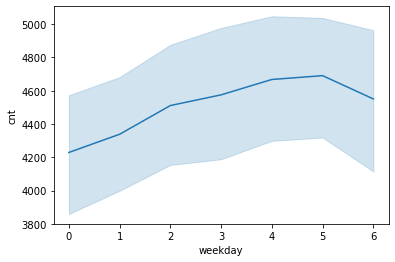

In [11]:
sns.lineplot(data = bike_df,x='weekday',y='cnt')

In [12]:
# Deriving "days since the dataset started"
from datetime import date


d0 = date(2017, 12, 31)
d1 = date(2018 ,12, 31)
d2 = bike_df.dteday

print(bike_df.dteday[0].year)
delta = d2.apply(lambda x:x.date()-d0 if x.date().year==2018 else x.date()-d1)
bike_df['day']= delta
bike_df['date'] = bike_df['dteday'].apply(lambda x:x.day)
bike_df['month'] = bike_df['dteday'].apply(lambda x:x.month)

2018


In [13]:
# Cleaning days
bike_df['day'] = bike_df['day'].astype(str)
bike_df['day'] = bike_df['day'].map(lambda x: x[:-4])
bike_df['day'] = bike_df['day'].astype(int)
bike_df

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,day,date,month
0,1,2018-01-01,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985,1,1,1
1,2,2018-01-02,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801,2,2,1
2,3,2018-01-03,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349,3,3,1
3,4,2018-01-04,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562,4,4,1
4,5,2018-01-05,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600,5,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
725,726,2019-12-27,1,1,12,0,4,1,2,10.420847,11.33210,65.2917,23.458911,247,1867,2114,361,27,12
726,727,2019-12-28,1,1,12,0,5,1,2,10.386653,12.75230,59.0000,10.416557,644,2451,3095,362,28,12
727,728,2019-12-29,1,1,12,0,6,0,2,10.386653,12.12000,75.2917,8.333661,159,1182,1341,363,29,12
728,729,2019-12-30,1,1,12,0,0,0,1,10.489153,11.58500,48.3333,23.500518,364,1432,1796,364,30,12


## 2. Data preparation

In [14]:
#Drop instant column as it is an identifier column.
bike_df.drop(['instant'],inplace=True,axis=1)

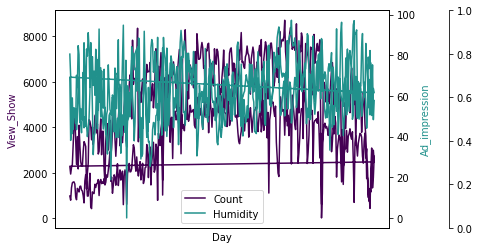

In [16]:
# plot for days vs Views_show and days vs Ad_impressions

fig = plt.figure()
host = fig.add_subplot(111)

par1 = host.twinx()
par2 = host.twinx()

host.set_xlabel("Day")
host.set_ylabel("View_Show")
par1.set_ylabel("Ad_impression")

color1 = plt.cm.viridis(0)
color2 = plt.cm.viridis(0.5)
color3 = plt.cm.viridis(.9)

p1, = host.plot(bike_df.day,bike_df.cnt, color=color1,label="Count")
p2, = par1.plot(bike_df.day,bike_df.hum,color=color2, label="Humidity")

lns = [p1, p2]
host.legend(handles=lns, loc='best')

# right, left, top, bottom
par2.spines['right'].set_position(('outward', 60))      
# no x-ticks                 
par2.xaxis.set_ticks([])
# Sometimes handy, same for xaxis
#par2.yaxis.set_ticks_position('right')

host.yaxis.label.set_color(p1.get_color())
par1.yaxis.label.set_color(p2.get_color())

plt.savefig("pyplot_multiple_y-axis.png", bbox_inches='tight')

In [ ]:
#by_year = bike_df.pivot(index=['yr','mth'],values='cnt')
by_year_month = pd.pivot_table(bike_df, values='cnt', index=['mnth'], columns=['yr'], aggfunc=np.sum)
by_year_month.plot()

In [ ]:
#by_year = bike_df.pivot(index=['yr','mth'],values='cnt')

In [ ]:
bike_df.plot.line(x='day', y='cnt')
by_year_month_index = by_year_month.set_index(['yr','mnth'])

In [ ]:
# Categorical variables replace with labels.
bike_df['weathersit']=bike_df['weathersit'].map({1:'CLEAR',2:'MIST',3:'LIGHT_RAIN',4:'HEAVY_RAIN'})

weathersit = pd.get_dummies(bike_df['weathersit'],drop_first=True)

In [ ]:
bike_df= pd.concat([bike_df,weathersit],axis=1)

In [ ]:
bike_df = bike_df.drop(['weathersit'],axis=1)

In [ ]:
bike_df['season']=bike_df['season'].map({1:'SPRING',2:'SUMMER',3:'FALL',4:'WINTER'})

seasons = pd.get_dummies(bike_df['season'],drop_first=True)
seasons

In [ ]:
bike_df= pd.concat([bike_df,seasons],axis=1)
bike_df = bike_df.drop(['season'],axis=1)

In [ ]:
sns.heatmap(bike_df.corr(),annot=True)